# Chaos Game Representation of DNA Sequence Encoding

* We consider the influenza dataset

In [1]:
from __future__ import division, print_function, absolute_import
from Time import *
import os
import sys
import scipy.io
from itertools import groupby
from Bio import SeqIO
import numpy as np
from dnacgr import *
from helper import *

In [2]:
## GPU computing 
import warnings
#### Numba GPU + CPU Computing ####
import numba as nb
from numba import jit
from numba import njit
from numba import vectorize, float64
from numba import types
from numba.extending import overload_method

In [3]:
pathfile = os.getcwdb()
print(pathfile)

b'c:\\Users\\letph\\Desktop\\MatlabCode\\Python Code'


In [4]:
#change working directory
os.chdir('c:\\Users\\letph\\Desktop\\MatlabCode\\Python Code\\ZCurve')

In [5]:
seqs = [seq for seq in SeqIO.parse(open("Influenza.fasta"), "fasta")]

In [6]:
## extract sequence in record to a list of strings containg DNA Sequence
@overload_method(types.Array, 'repeat')
def extractDNA_Sequence(seqs):
    DNASequences = []
    append = DNASequences.append
    n = len(seqs)
    for i in range(n):
        dna_sq = str(seqs[i].seq)
        append(dna_sq)
    return  DNASequences

In [7]:
DNASequences  = extractDNA_Sequence(seqs)

# Converting DNASequences from Influenza data to Chaos Game Representation 

In [8]:
@overload_method(types.Array, 'repeat')
def chaosReps(DNAs):
    ls_chaos =[]
    append = ls_chaos.append
    n = len(DNAs)
    for i in range(n):
        DNA = DNAs[i] # extract the dna sequence 
        chaos_val = mk_cgr(DNA)
        append(chaos_val)
    return ls_chaos

In [9]:
Datas_dna = chaosReps(DNASequences) # Chaos Reps conversion 

In [10]:
os.chdir('c:\\Users\\letph\\Desktop\\MatlabCode\\Python Code\\Chaos') ## change to this directory to save the Datas conversion 

In [11]:
## save datas dna as chaos representation
nsize = len(Datas_dna)
for i in range(nsize):
    main = str(i+1) + '_' + 'dna' +'_chaos.txt'
    Matrix = Datas_dna[i]
    np.savetxt(main, Matrix, delimiter=', ', fmt ='%.10f')

# Persistence Homology

In [12]:
import gudhi as gd 
from sklearn import manifold 
from pylab import *
from ripser import ripser, Rips
from persim import plot_diagrams
from matplotlib import pyplot as plt
## Metric 
from gudhi.hera import bottleneck_distance as bottleneck

In [13]:
## function to get the diagrams with given input: 
"""Input: datalist"""
@overload_method(types.Array, 'repeat')
def DiagListComp(input):
    rips = Rips(maxdim=1, coeff=2)
    DiagramsList = [rips.fit_transform(data) for data in input]
    return DiagramsList

In [14]:
tic()
Diagrams = DiagListComp(Datas_dna)
toc()

Rips(maxdim=1, thresh=inf, coeff=2, do_cocycles=False, n_perm = None, verbose=True)
Elapsed time: 51.164854 seconds.



In [15]:
%matplotlib inline  

In [16]:
rips = Rips()
def plotDiagrams(i,k, method = rips):    
    i, k = i,k
    title1 = 'Type ' + str(i)
    title2 = 'Type ' + str(k)
    plt.figure(figsize = (12,6))
    plt.subplot(1,2,1)
    rips.plot(Diagrams[i], show = False)    
    plt.title(title1)
    plt.subplot(1,2,2)
    rips.plot(Diagrams[k], show = False)
    plt.title(title2)
    plt.show()

Rips(maxdim=1, thresh=inf, coeff=2, do_cocycles=False, n_perm = None, verbose=True)


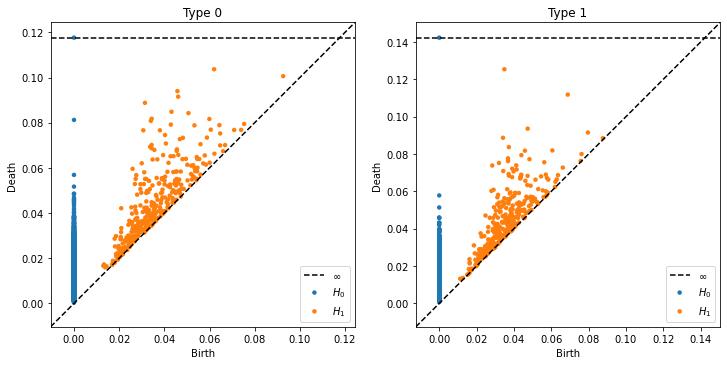

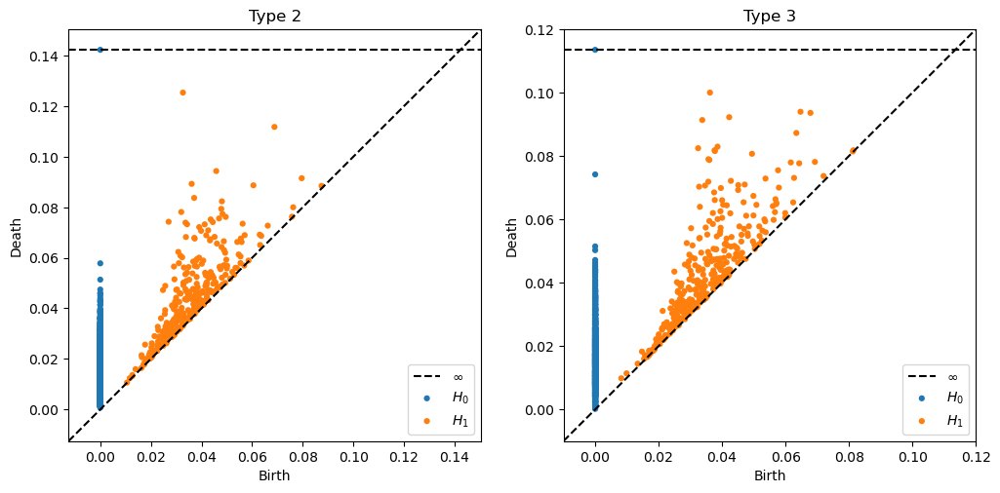

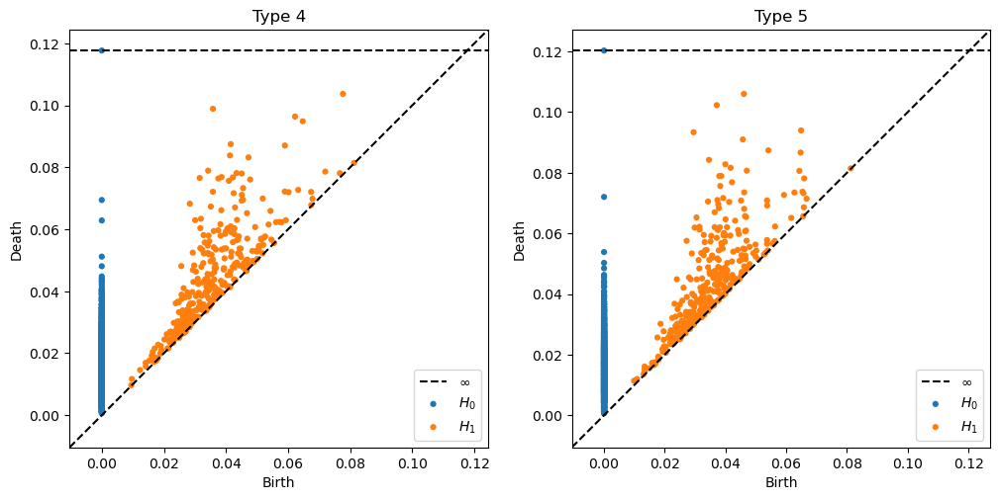

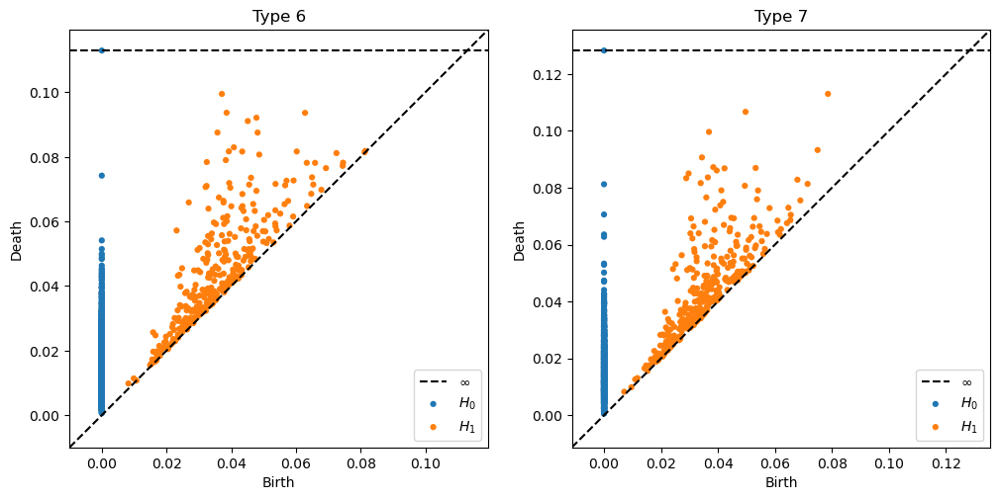

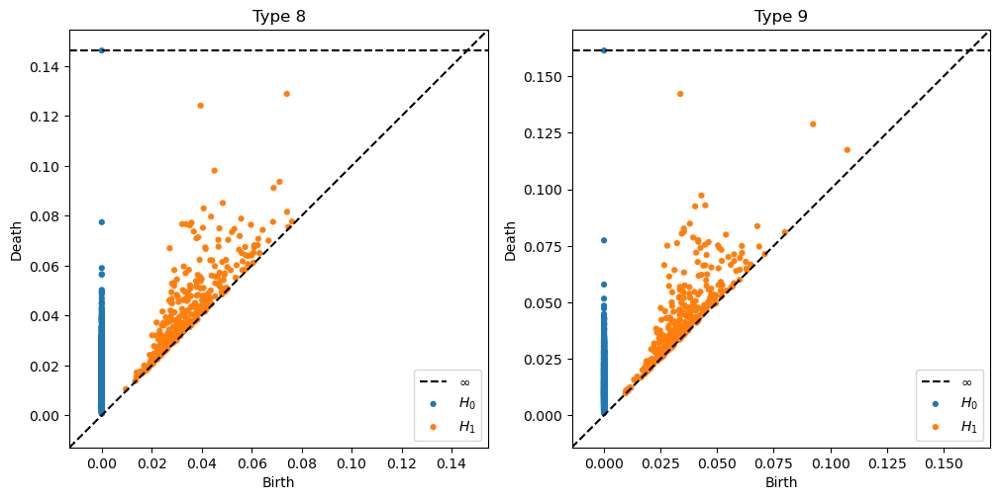

...

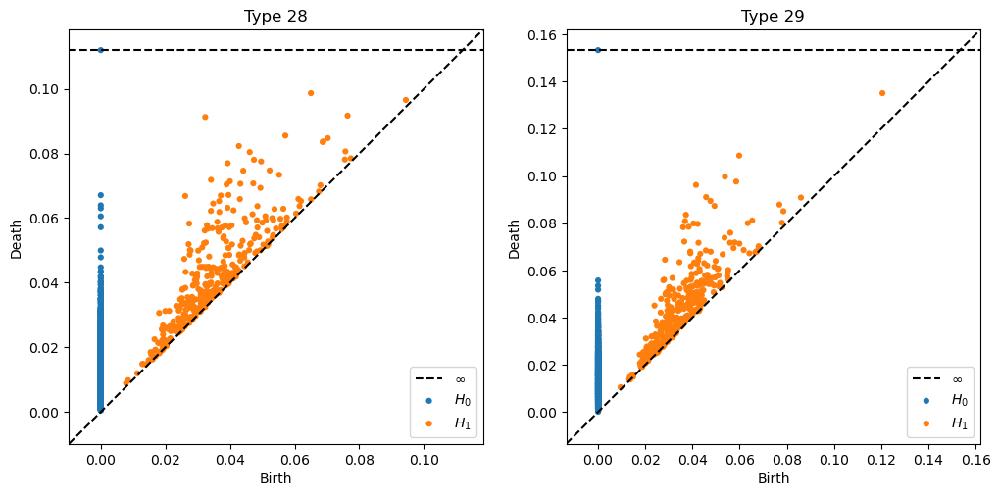

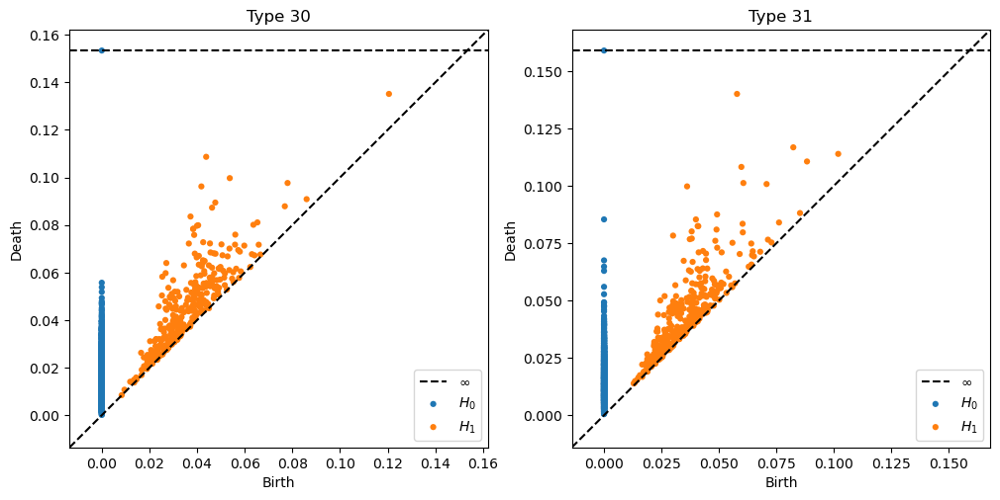

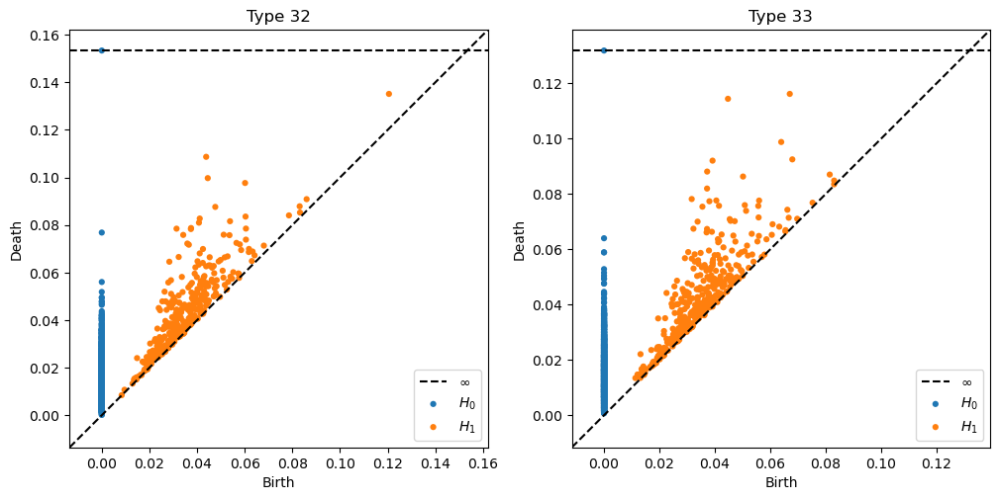

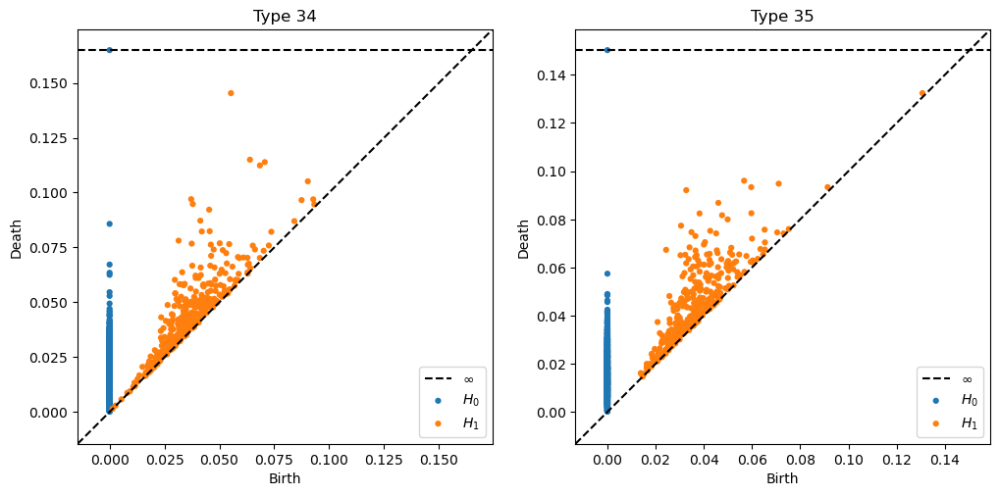

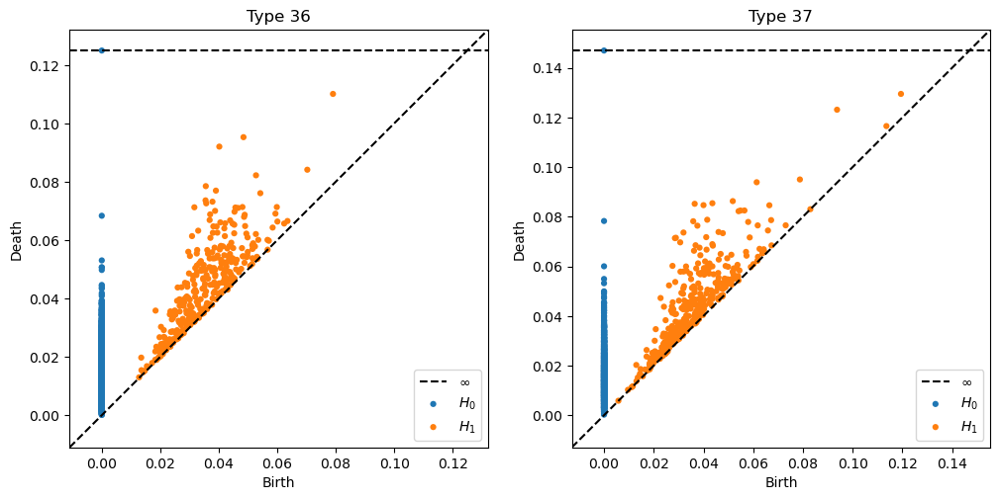

In [17]:
plotDiagrams(0,1,method = rips)
plotDiagrams(2,3,method = rips)

plotDiagrams(4,5,method = rips)
plotDiagrams(6,7,method = rips)

plotDiagrams(8,9,method = rips)
plotDiagrams(10,11,method = rips)

plotDiagrams(12,13,method = rips)
plotDiagrams(14,15,method = rips)

plotDiagrams(16,17,method = rips)
plotDiagrams(18,19,method = rips)

plotDiagrams(20,21,method = rips)
plotDiagrams(22,23,method = rips)

plotDiagrams(24,25,method = rips)
plotDiagrams(26,27,method = rips)

plotDiagrams(28,29,method = rips)
plotDiagrams(30,31,method = rips)

plotDiagrams(32,33,method = rips)
plotDiagrams(34,35,method = rips)

plotDiagrams(36,37,method = rips)

# Distance Matrix

* We consider using Wasserstein Distance 

In [18]:
Diags_H0 = [Diagrams[i][0] for i in range(38)]  # get the H0 diagrams
Diags_H1 = [Diagrams[i][1] for i in range(38)]  ## Get the H1 diagrams 

In [20]:
from gudhi.wasserstein import wasserstein_distance
import cython 
import ot

In [22]:
## Function to compute the Bottle Neck distance matrix from a list of diagrams
@overload_method(types.Array, 'repeat')
def MatrixDistance(diagsList, nsize):
    BDist = np.zeros((nsize,nsize))
    slicing = nsize
    for i in range(len(diagsList)-1):
        for j in range((i+1),slicing):
            diagi = diagsList[i]
            diagj = diagsList[j]
            BDist[i,j] = wasserstein_distance(diagi, diagj)
        BottleDist = BDist + BDist.transpose()
        
    return BottleDist

In [23]:
distanceMat_H0 = MatrixDistance(Diags_H0,38)

In [34]:
distanceMat_H1 = MatrixDistance(Diags_H1,38)

In [35]:
os.chdir('c:\\Users\\letph\\Desktop\\MatlabCode\\Python Code\\Chaos\\Distance Matrix')

In [36]:
save('DistanceMat_H0.npy', distanceMat_H0) ## save the result. 
np.savetxt('DistanceMat_H0.txt', distanceMat_H0, fmt = "%10.10f", delimiter=',')

In [37]:
save('DistanceMat_H1.npy', distanceMat_H1) ## save the result. 
np.savetxt('DistanceMat_H1.txt', distanceMat_H1, fmt = "%10.10f", delimiter=',')